In [1]:
pip install pydub

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
#@title **Convert** **mp3** **to** **wav** 
from pydub import AudioSegment

def convert_mp3_to_wav(mp3_file, wav_file):
    audio = AudioSegment.from_mp3(mp3_file)
    audio.export(wav_file, format='wav')

# Contoh penggunaan
mp3_file = 'berita.mp3'
wav_file = 'berita.wav'
convert_mp3_to_wav(mp3_file, wav_file)


**Audio** **Tanpa** **Noise**

In [3]:
from IPython.display import Audio
# Hear the audio
Audio('berita.wav')

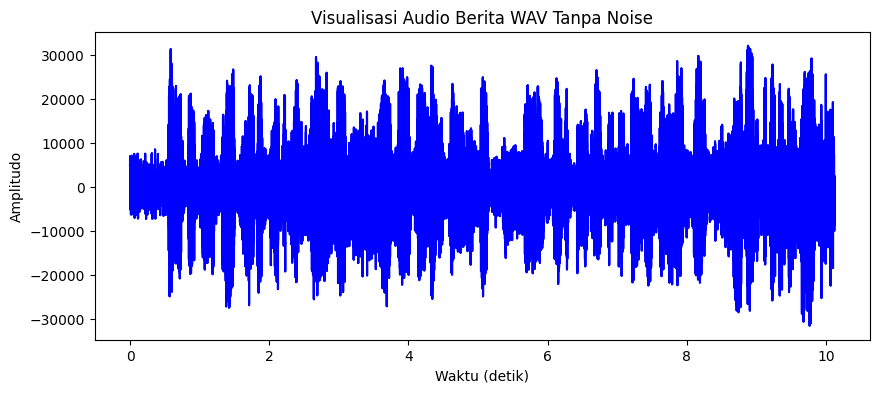

In [4]:
#@title Visualisasi Audio Berita { display-mode: "form" }
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile

sample_rate, data = wavfile.read('berita.wav')
# Menghitung durasi audio dalam detik
duration = len(data) / sample_rate

# Membuat array waktu
time = np.linspace(0., duration, len(data))

plt.figure(figsize=(10, 4))
plt.plot(time, data, color='b')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.title('Visualisasi Audio Berita WAV Tanpa Noise')
plt.show()


**Audio** **Dengan** **Noise**

In [ ]:
from IPython.display import Audio
# Hear the audio
Audio('beritanoise.wav')

In [5]:
pip install noisereduce

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


**Visualisasi Audio Tanpa Noise dan Dengan** **Noise**

/usr/local/lib/python3.10/dist-packages/scipy/signal/_signaltools.py:1551: UserWarning: kernel_size exceeds volume extent: the volume will be zero-padded.
  warnings.warn('kernel_size exceeds volume extent: the volume will be '


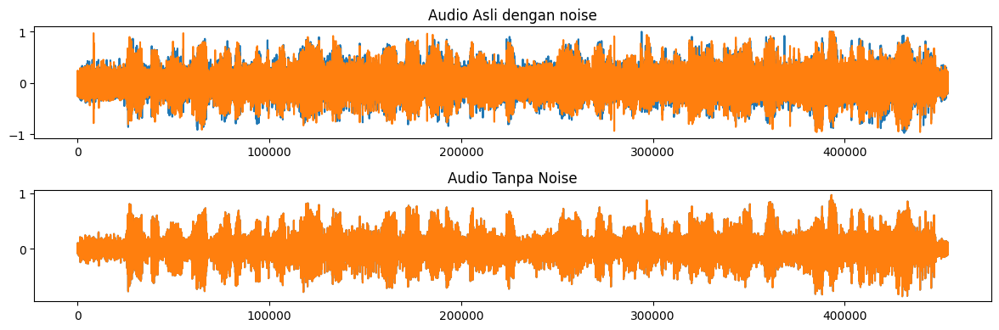

In [6]:
import os
import numpy as np
import scipy.signal as signal
import soundfile as sf
import matplotlib.pyplot as plt

# Mendapatkan jalur lengkap ke file audio
audio_filename = 'beritanoise.wav'
audio_path = os.path.join(os.getcwd(), audio_filename)


audio_data, sr = sf.read(audio_path)

# Ekstraksi noise dari audio
noise_clip = audio_data[:100000] \

# Mengurangi noise dari audio menggunakan filter median
reduced_noise = signal.medfilt(audio_data, kernel_size=3)

# Menampilkan sinyal audio asli
plt.figure(figsize=(12, 4))
plt.subplot(2, 1, 1)
plt.title('Audio Asli dengan noise')
plt.plot(audio_data)
plt.tight_layout()

# Menampilkan sinyal audio yang sudah dihilangkan noise
plt.subplot(2, 1, 2)
plt.title('Audio Tanpa Noise')
plt.plot(reduced_noise)
plt.tight_layout()

# Menyimpan audio hasil pengurangan kebisingan
output_path = 'beritareduce.wav'
sf.write(output_path, reduced_noise, sr)

# Menampilkan plot
plt.show()


**Hasil Audio Setelah Reduce Noise**

In [7]:
from IPython.display import Audio
# Hear the audio
Audio('beritareduce.wav')

**Visualisasi Spektogram Audio Tanpa Noise**

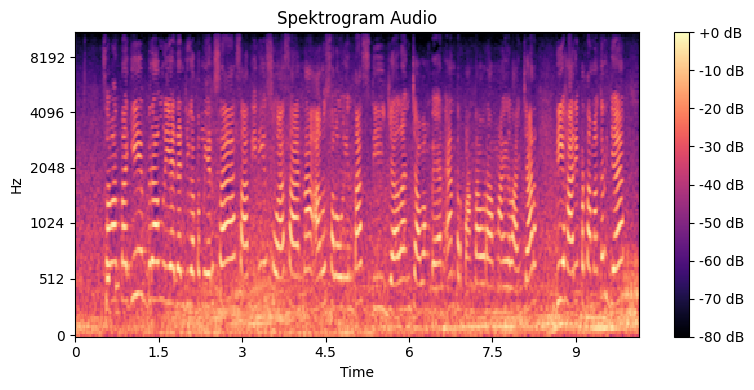

In [ ]:
import os
import librosa
import librosa.display
import matplotlib.pyplot as plt

# Mendapatkan jalur lengkap ke file audio
audio_filename = 'berita.wav'
audio_path = os.path.join(os.getcwd(), audio_filename)

# Memuat file audio
audio_data, sr = librosa.load(audio_path)

# Menghitung spektrogram audio
spectrogram = librosa.feature.melspectrogram(y=audio_data, sr=sr)

# Mengkonversi amplitudo spektrogram ke skala logaritmik (dB)
spectrogram_db = librosa.power_to_db(spectrogram, ref=np.max)

# Menampilkan spektrogram
plt.figure(figsize=(8, 4))
librosa.display.specshow(spectrogram_db, sr=sr, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Spektrogram Audio')
plt.tight_layout()
plt.show()


**Visualisasi Spektogram Audio Dengan Noise**

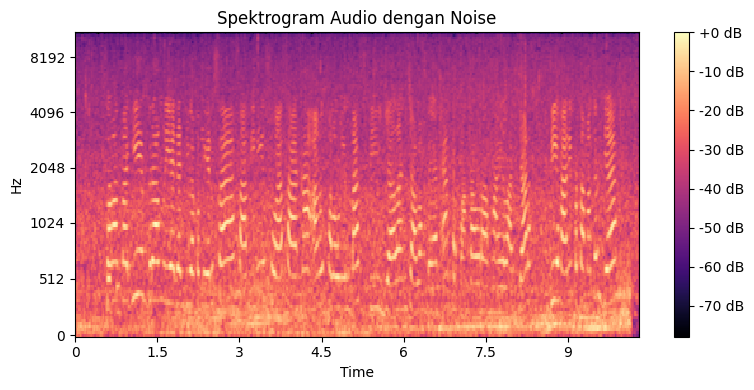

In [ ]:
import os
import librosa
import librosa.display
import matplotlib.pyplot as plt

# Mendapatkan jalur lengkap ke file audio
audio_filename = 'beritanoise.wav'
audio_path = os.path.join(os.getcwd(), audio_filename)

# Memuat file audio
audio_data, sr = librosa.load(audio_path)

# Menghitung spektrogram audio
spectrogram = librosa.feature.melspectrogram(y=audio_data, sr=sr)

# Mengkonversi amplitudo spektrogram ke skala logaritmik (dB)
spectrogram_db = librosa.power_to_db(spectrogram, ref=np.max)

# Menampilkan spektrogram
plt.figure(figsize=(8, 4))
librosa.display.specshow(spectrogram_db, sr=sr, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Spektrogram Audio dengan Noise')
plt.tight_layout()
plt.show()


**Visualisasi Spektogram Audio Reduce Noise**

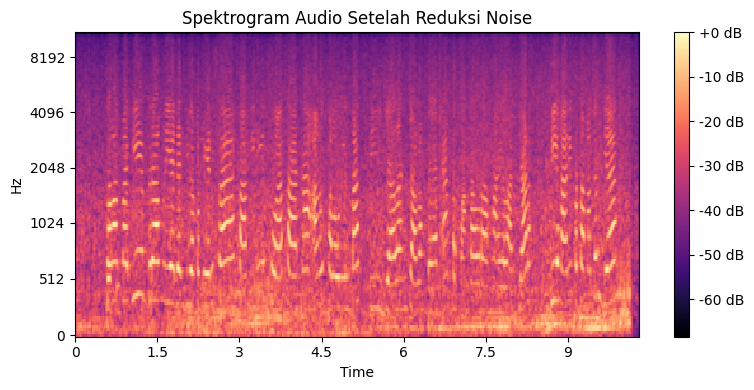

In [ ]:
import os
import librosa
import librosa.display
import matplotlib.pyplot as plt

# Mendapatkan jalur lengkap ke file audio
audio_filename = 'beritareduce.wav'
audio_path = os.path.join(os.getcwd(), audio_filename)

# Memuat file audio
audio_data, sr = librosa.load(audio_path)

# Menghitung spektrogram audio
spectrogram = librosa.feature.melspectrogram(y=audio_data, sr=sr)

# Mengkonversi amplitudo spektrogram ke skala logaritmik (dB)
spectrogram_db = librosa.power_to_db(spectrogram, ref=np.max)

# Menampilkan spektrogram
plt.figure(figsize=(8, 4))
librosa.display.specshow(spectrogram_db, sr=sr, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Spektrogram Audio Setelah Reduksi Noise')
plt.tight_layout()
plt.show()


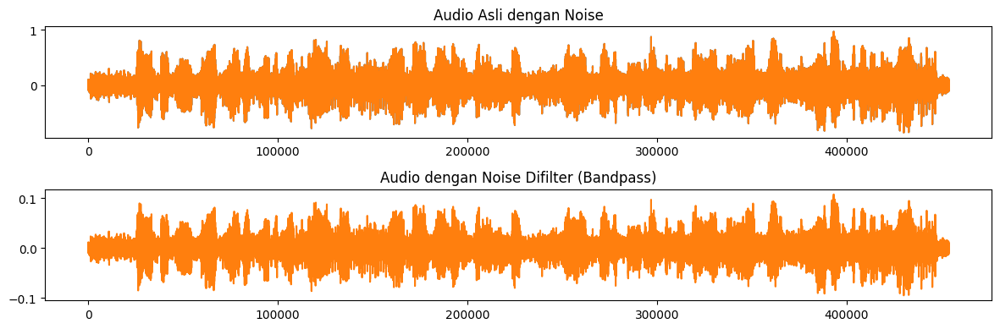

In [26]:
import os
import numpy as np
import scipy.signal as signal
import soundfile as sf
import matplotlib.pyplot as plt

# Mendapatkan jalur lengkap ke file audio
audio_filename = 'beritareduce.wav'
audio_path = os.path.join(os.getcwd(), audio_filename)

audio_data, sr = sf.read(audio_path)

# Membuat filter bandpass
lowcut = 1000  # Frekuensi batas bawah
highcut = 4000  # Frekuensi batas atas
nyquist = 0.6 * sr
low = lowcut / nyquist
high = highcut / nyquist
b, a = signal.butter(2, [low, high], btype='band')

# Memfilter audio dengan filter bandpass
filtered_audio = signal.lfilter(b, a, audio_data)

# Menampilkan sinyal audio asli
plt.figure(figsize=(12, 4))
plt.subplot(2, 1, 1)
plt.plot(audio_data)
plt.title('Audio Asli dengan Noise')
plt.tight_layout()

# Menampilkan sinyal audio yang telah difilter
plt.subplot(2, 1, 2)
plt.plot(filtered_audio)
plt.title('Audio dengan Noise Difilter (Bandpass)')
plt.tight_layout()

# Menyimpan audio hasil filter
output_path = 'audio_filtered1.wav'
sf.write(output_path, filtered_audio, sr)

# Menampilkan plot
plt.show()


Audio Setelah Difilter Bandpass

In [24]:
from IPython.display import Audio
# Hear the audio
Audio('audio_filtered.wav')

In [27]:
from IPython.display import Audio
# Hear the audio
Audio('audio_filtered1.wav')